# Minicase - Request API and Raw Data Cleanup from Wikipedia
This case will require you to use HTTP requests to receive JSON objects through an API in the first section; and then clean real data from the open web in the second section. In both cases, rather than solely demonstrating your ability to work with Python, this homework also requires investigative skill, understanding how to extract structured data from a complicated external web-based source.


# Task 1: US Census Bureau API Calls

Use the documentation for the US Census Bureau API that we used in class. 

https://www.census.gov/data/developers/data-sets/acs-1year.2018.html

The next several parts of this homework will help you attempt to answer the following question:

**In the United States, which state has the highest proportion of renters?**

To get that answer, we'll break up the problem into smaller sub-tasks.

### Part 1: Regional Geocodes 

You received a list of geocodes as part of this assignment. Create a new Python object, either a dictionary or Pandas dataframe, to store those geocodes for each unique state or territory in the United States, reading in from the provided CSV file. 

In [ ]:
from google.colab import files
import numpy as np
import pandas as pd
import json
import requests

In [ ]:
files.upload()

Saving geocodes.csv to geocodes.csv


{'geocodes.csv': b'summary_level,state,county,county_subdivision,place,consolidated_city,name\r\n010,00,000,00000,00000,00000,United States\r\n040,01,000,00000,00000,00000,Alabama\r\n050,01,001,00000,00000,00000,Autauga County\r\n050,01,003,00000,00000,00000,Baldwin County\r\n050,01,005,00000,00000,00000,Barbour County\r\n050,01,007,00000,00000,00000,Bibb County\r\n050,01,009,00000,00000,00000,Blount County\r\n050,01,011,00000,00000,00000,Bullock County\r\n050,01,013,00000,00000,00000,Butler County\r\n050,01,015,00000,00000,00000,Calhoun County\r\n050,01,017,00000,00000,00000,Chambers County\r\n050,01,019,00000,00000,00000,Cherokee County\r\n050,01,021,00000,00000,00000,Chilton County\r\n050,01,023,00000,00000,00000,Choctaw County\r\n050,01,025,00000,00000,00000,Clarke County\r\n050,01,027,00000,00000,00000,Clay County\r\n050,01,029,00000,00000,00000,Cleburne County\r\n050,01,031,00000,00000,00000,Coffee County\r\n050,01,033,00000,00000,00000,Colbert County\r\n050,01,035,00000,00000,00

In [ ]:
# read the csv
geocodes = pd.read_csv("geocodes.csv", dtype = str)
geocodes.head()

,summary_level,state,county,county_subdivision,place,consolidated_city,name
0,010,00,000,00000,00000,00000,United States
1,040,01,000,00000,00000,00000,Alabama
2,050,01,001,00000,00000,00000,Autauga County
3,050,01,003,00000,00000,00000,Baldwin County
4,050,01,005,00000,00000,00000,Barbour County


### Part 2: Choosing Variables 

Looking through the documentation from the ACS survey API, choose at least two variables that represent, or are direct proxies for, the following concepts (you can use more if you want, but you do not need to):

   * Total population of a state
   * Total quantity of owner-occupied housing (or conversely, total number of renter-occupied housing).

Make at least a sample API request to ensure that the variable has state-level data available. 


In [ ]:
files.upload()

Saving acs_variables.json to acs_variables.json


{'acs_variables.json': b'{\n  "variables": {\n    "for": {\n      "label": "Census API FIPS \'for\' clause",\n      "concept": "Census API Geography Specification",\n      "predicateType": "fips-for",\n      "group": "N/A",\n      "limit": 0,\n      "predicateOnly": true\n    },\n    "in": {\n      "label": "Census API FIPS \'in\' clause",\n      "concept": "Census API Geography Specification",\n      "predicateType": "fips-in",\n      "group": "N/A",\n      "limit": 0,\n      "predicateOnly": true\n    },\n    "ucgid": {\n      "label": "Uniform Census Geography Identifier clause",\n      "concept": "Census API Geography Specification",\n      "predicateType": "ucgid",\n      "group": "N/A",\n      "limit": 0,\n      "predicateOnly": true\n    },\n    "B24022_060E": {\n      "label": "Estimate!!Total!!Female!!Service occupations!!Food preparation and serving related occupations",\n      "concept": "SEX BY OCCUPATION AND MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2018 INFLATION-ADJUSTED

In [ ]:
# read the file and transfer it to dataframe
f = open("acs_variables.json").read()
acs = json.loads(f)
var = acs['variables']
var = pd.DataFrame(var).T
var

,label,concept,predicateType,group,limit,predicateOnly,attributes,required
for,Census API FIPS 'for' clause,Census API Geography Specification,fips-for,N/A,0,True,NaN,NaN
in,Census API FIPS 'in' clause,Census API Geography Specification,fips-in,N/A,0,True,NaN,NaN
ucgid,Uniform Census Geography Identifier clause,Census API Geography Specification,ucgid,N/A,0,True,NaN,NaN
B24022_060E,Estimate!!Total!!Female!!Service occupations!!...,SEX BY OCCUPATION AND MEDIAN EARNINGS IN THE P...,int,B24022,0,NaN,"B24022_060M,B24022_060MA,B24022_060EA",NaN
B19001B_014E,"Estimate!!Total!!$100,000 to $124,999",HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 201...,int,B19001B,0,NaN,"B19001B_014EA,B19001B_014M,B19001B_014MA",NaN
...,...,...,...,...,...,...,...,...
B20005I_071E,"Estimate!!Total!!Female!!Worked full-time, yea...",SEX BY WORK EXPERIENCE IN THE PAST 12 MONTHS B...,int,B20005I,0,NaN,"B20005I_071M,B20005I_071MA,B20005I_071EA",NaN
B25124_022E,Estimate!!Total!!Owner occupied!!3-person hous...,TENURE BY HOUSEHOLD SIZE BY UNITS IN STRUCTURE,int,B25124,0,NaN,"B25124_022M,B25124_022MA,B25124_022EA",NaN
B08113_054E,Estimate!!Total!!Worked at home!!Speak other l...,MEANS OF TRANSPORTATION TO WORK BY LANGUAGE SP...,int,B08113,0,NaN,"B08113_054EA,B08113_054M,B08113_054MA",NaN
B06009_006E,Estimate!!Total!!Graduate or professional degree,PLACE OF BIRTH BY EDUCATIONAL ATTAINMENT IN TH...,int,B06009,0,NaN,"B06009_006EA,B06009_006M,B06009_006MA",NaN


In [ ]:
#base url
host = "https://api.census.gov/data"
year = "2018"
dataset = "acs/acs1/profile"
base_url = "/".join([host,year,dataset])

#Total population of a state:DP05_0001E
#Total quantity of owner-occupied housing:DP04_0046E

pop_pred = {}

pop_vars = ["NAME","DP05_0001E","DP04_0046E"]
pop_pred["get"] = ",".join(pop_vars)
pop_pred["for"] = "state:*"
pop_pred["key"] = "8537894371a19c4f9cbfb7681095b5dba6b523c7"

response = requests.get(base_url,params = pop_pred)
print(response)

<Response [200]>


### Part 3: Retrieving Values

Once you've selected at least two variables that look appropriate, define in text for an exteranl audience: what exactly do those variables allow you to calculate, per state? For example, clarify whether your variables refer to housing units, individuals, or families, based on your best understanding of the API documentation.

Next, use the API to retrieve the value of these variables for each state, matching responses to state names using the geocodes from Task 1. If possible, use 2018 data. Store these retrieved results in a dictionary or Pandas dataframe.

*The two variables I choose are 1) the unweighted sample count of the population and 2) the total popuation in occupied housing units by tenure (owner occupied).*

*The first one represents the population of each state based on a sample of the population. The second variable counts the total number of individuals that are occupying self-owned housing units. Both variables use individuals as their base unit.*

*I will calculate the percentage of the population in each state that occupies a rented housing unit (total population in occupied, (total population - owner-occupied housing)/total population), and rank the results.*

In [ ]:
print(response.json()[0])

['NAME', 'DP05_0001E', 'DP04_0046E', 'state']


In [ ]:
col_names = ['state','population','owner_occupied_housing','state_number']
df = pd.DataFrame(columns = col_names, data = response.json()[1:])
df['population'] = df['population'].astype(int)
df['owner_occupied_housing'] = df['owner_occupied_housing'].astype(int)
df

,state,population,owner_occupied_housing,state_number
0,Wisconsin,5813568,1592440,55
1,Wyoming,577737,161812,56
2,Puerto Rico,3195153,793791,72
3,Mississippi,2986530,756195,28
4,Missouri,6126452,1625854,29
5,Montana,1062305,291018,30
6,Nebraska,1929268,505666,31
7,Nevada,3034392,641551,32
8,New Hampshire,1356458,378742,33
9,New Jersey,8908520,2078948,34


### Part 4: Ranking states by renter percentage

Using the values you fetched in the previous task, calculate the approximate proportion of the population in each state that rents rather than lives in a home they own. Depending on what variables you selected, the exact quantity or ranking may differ from student to student.

To complete this section of the homework assignment, output that final calculated value for each state (they do not need to be sorted or visualized). Which state has the highest proportion of renters based on your calculation? Which state has the lowest proportion?



In [ ]:
df['renter_percentage'] = (df.population - df.owner_occupied_housing)/df.population
df

,state,population,owner_occupied_housing,state_number,renter_percentage
0,Wisconsin,5813568,1592440,55,0.726082
1,Wyoming,577737,161812,56,0.719921
2,Puerto Rico,3195153,793791,72,0.751564
3,Mississippi,2986530,756195,28,0.746798
4,Missouri,6126452,1625854,29,0.734617
5,Montana,1062305,291018,30,0.726050
6,Nebraska,1929268,505666,31,0.737897
7,Nevada,3034392,641551,32,0.788573
8,New Hampshire,1356458,378742,33,0.720786
9,New Jersey,8908520,2078948,34,0.766634


In [ ]:
df.sort_values(by='renter_percentage', ascending=False)

# The District of Columbia has the highest proportion of renters of 82.70%;
# Maine has the lowest proportion of renters of 69.6%;

df.to_csv('Yixuan Li-Part1-hw4.csv')
files.download("Yixuan Li-Part1-hw4.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Extra Credit

**For up to 3 points of extra credit, visualize the results of your investigation.**
   * Present your list of states in a figure showing the proportion of the population that owns their home vs. renting.
   * Sort that list in ascending or descending order in your figure.
   * Choose appropriate axes, labels, format, and color scheme to make your findings clear to an external audience.



In [ ]:
df['owner_percentage'] = df.owner_occupied_housing/df.population
df.sort_values("owner_percentage",inplace=True)
df2 = df[['state','renter_percentage','owner_percentage']]
states_list = df2.values.tolist()
print(states_list)

[['District of Columbia', 0.8269782405990419, 0.17302175940095807], ['California', 0.8188523940552183, 0.18114760594478177], ['Hawaii', 0.8131885383293523, 0.1868114616706477], ['New York', 0.7976797300653166, 0.20232026993468344], ['Texas', 0.7897667554124134, 0.2102332445875866], ['Nevada', 0.7885734605153191, 0.21142653948468096], ['Utah', 0.7772984446894361, 0.22270155531056388], ['Alaska', 0.7733938310746123, 0.22660616892538762], ['Georgia', 0.7693387740357766, 0.2306612259642235], ['New Jersey', 0.7666337393865648, 0.23336626061343524], ['Massachusetts', 0.7651873351328695, 0.2348126648671305], ['Arizona', 0.7637408483352357, 0.23625915166476427], ['Rhode Island', 0.7622714139116535, 0.23772858608834643], ['Washington', 0.7586137570364422, 0.24138624296355787], ['Florida', 0.7582908378551902, 0.24170916214480975], ['Louisiana', 0.755894984911946, 0.24410501508805407], ['Oregon', 0.7554466268627796, 0.24455337313722034], ['Maryland', 0.7546354140636713, 0.24536458593632865], ['Vi

Text(0.5, 1.0, 'Owner vs. Renting by State')

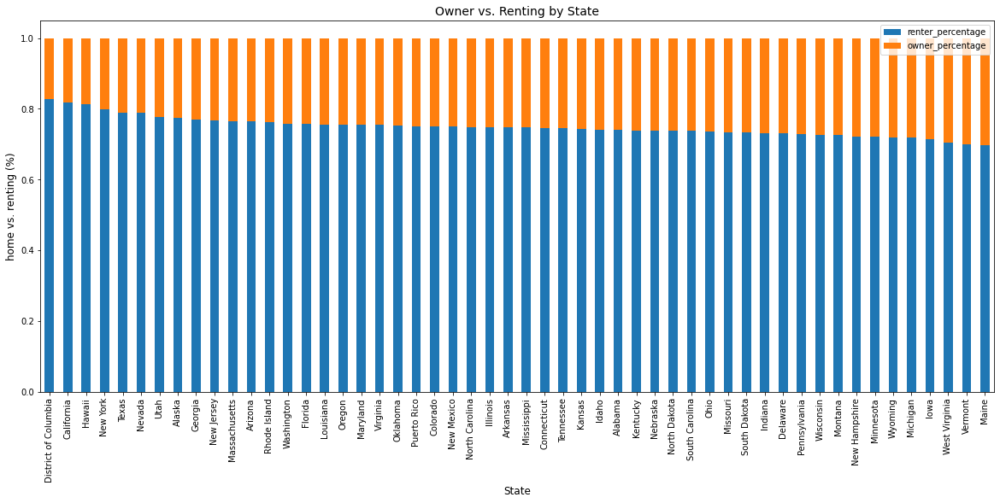

In [ ]:
import matplotlib.pyplot as plt
df2.plot(kind = 'bar', x = 'state',figsize = (20,8),stacked=True)
plt.style.use('ggplot')
plt.xlabel('State', fontsize = 12)
plt.ylabel('home vs. renting (%)', fontsize = 12)
plt.title('Owner vs. Renting by State', fontsize = 14)

# Task 2: Raw Data Cleanup from Wikipedia

Next, we will be scraping content from Wikipedia, which makes all public edits in the history of the wiki available through a public API. This API is documented at ​https://www.mediawiki.org/wiki/API:Main_page​ but you will not have to work with it directly; in code below we have given some helper functions that you can use to make things easier.


## Initial Help

We have already included a few functions below, which will allow you to call `​page_text()` in your code. This will fetch either the raw HTML of any Wikipedia page, or the plan text in either single string or list-of-strings format, and cache the result locally. 

In [ ]:

import hashlib, os, json, requests
from lxml import etree

# Input: Page name of a Wikipedia article.
# 
# Returns: Full HTML source of the named article if it exists,
#          or None if no such page exists.
def __api_GET_latest_page(title):
    parameters = {
        "action": "parse",
        "page": title,
        "format": "json"
    }
    response_json = __get("revisions", title, parameters)
    if("parse" in response_json.keys() 
        and "text" in response_json["parse"].keys() 
        and "*" in response_json["parse"]["text"].keys()):
        return response_json["parse"]["text"]["*"]
    return None    

# Internal function to hide a caching API request into a single private function.
# This function will save you a lot of headaches in writing your own HTTP requests
# and will save the Wikimedia foundation some bandwidth since you'll fetch a local
# copy if you have already retrieved an article text at least once.
def __get(function_key, key, parameters, check_cache=True, write_cache=True):
    target = "https://en.wikipedia.org/w/api.php"
    cache_path = "cached_api"
    params_unicode = str(parameters).encode('utf-8')
    md5 = hashlib.md5(params_unicode).hexdigest()
    return_json = None

    cache_file = os.path.join(cache_path, function_key, md5)
    cache_exists = os.path.isfile(cache_file)
    if cache_exists:
        try:
            json_in = open(cache_file, "r")
            json_str = json_in.read()
            return_json = json.loads(json_str)
            if "error" in return_json.keys() and "code" in return_json["error"].keys() and return_json["error"]["code"]=="maxlag":
                cache_exists = False
        except:
            cache_exists = False

    if not cache_exists:
        cache_dir = os.path.dirname(cache_file)
        if not os.path.isdir(cache_dir):
            os.makedirs(cache_dir)
        r = requests.get(target, params=parameters)
        request_json = r.json()
        json_out = open(cache_file, "w")
        print(json.dumps(request_json), file=json_out)
        return_json = request_json
    return return_json

# This function takes as input a parsed HTML tree and returns the same
# tree but with a set of tags removed, mostly the contents of tables and scripts.
# This makes parsing the actual contents of a page easier.
def __remove_tables_and_scripts(tree):
    tags_to_remove = ["tbody", "td", "script"]
    for tag in tags_to_remove:
        elements = tree.find(f".//{tag}")
        if elements is not None:
            for e in elements:
                e.getparent().remove(e)
    return tree

# This function takes two required and one optional parameters as input.
#
# Required:
# name: Name of a Wikipedia page to retrieve.
# format: Type of content that you want returned. Options include:
#         "html" : Full HTML content of the page you requested.
#         "text" : Full content of the page you requested as a single string,
#                  with all HTML tags removed.
#         "list" : Full content of the page you requested with all HTML removed,
#                  but each paragraph on the page is a separate string, and the
#                  page as a whole is returned to you as a list of paragraphs.
#
# Optional:
# include_tables: By default, all tables and scripts in the HTML text will be 
#                 removed from the text that gets sent back to you. If you want
#                 to include that content, you can pass in True instead.
#
# This function returns the content of the page in the format that you specified.
def page_text(name, format, include_tables = False):
    try:
        result = __api_GET_latest_page(name)
    except Exception as e:
        print("API request failed.")
        print(e)
    if result:
        e = etree.fromstring(result)
        if not include_tables:
            e = __remove_tables_and_scripts(e)
        if format == "html":
            return str(etree.tostring(e))
        elif format == "text":
            return ''.join(e.itertext())
        elif format == "list":
            return ''.join(e.itertext()).split('\n')
    else:
        print("Failed to retrieve a page.")
        return None


The `page_text()` function above is called with two parameters, first a page name and then a format. `text` will return the entire page's text as a single string, `html` will return the page including all HTML formatting, and `list` will return each line of the page as a separate string, all stored in a single list object.

In [ ]:
page_text("Ursula K. Le Guin", "text")

'American fantasy and science fiction author (1929–2018)\n\n\n.mw-parser-output .infobox-subbox{padding:0;border:none;margin:-3px;width:auto;min-width:100%;font-size:100%;clear:none;float:none;background-color:transparent}.mw-parser-output .infobox-3cols-child{margin:auto}\nUrsula Kroeber Le Guin (/ˈkroʊbər lə ˈɡwɪn/;[1] October 21, 1929 – January 22, 2018) was an American author best known for her works of speculative fiction, including science fiction works set in her Hainish universe, and the Earthsea fantasy series. She was first published in 1959, and her literary career spanned nearly sixty years, producing more than twenty novels and over a hundred short stories, in addition to poetry, literary criticism, translations, and children\'s books. Frequently described as an author of science fiction, Le Guin has also been called a "major voice in American Letters".[2] Le Guin herself said she would prefer to be known as an "American novelist".[3]\nLe Guin was born in Berkeley, Califor

In [ ]:
page_text("Ursula K. Le Guin", "html")

'b\'<div class="mw-parser-output"><div class="shortdescription nomobile noexcerpt noprint searchaux" style="display:none">American fantasy and science fiction author (1929&#8211;2018)</div>\\n<p class="mw-empty-elt">\\n</p>\\n<style data-mw-deduplicate="TemplateStyles:r1048617464">.mw-parser-output .infobox-subbox{padding:0;border:none;margin:-3px;width:auto;min-width:100%;font-size:100%;clear:none;float:none;background-color:transparent}.mw-parser-output .infobox-3cols-child{margin:auto}</style><table class="infobox vcard"><tbody/></table>\\n<p><b>Ursula Kroeber Le Guin</b> (<span class="rt-commentedText nowrap"><span class="IPA nopopups noexcerpt"><a href="/wiki/Help:IPA/English" title="Help:IPA/English">/<span style="border-bottom:1px dotted"><span title="/&#712;/: primary stress follows">&#712;</span><span title="\\\'k\\\' in \\\'kind\\\'">k</span><span title="\\\'r\\\' in \\\'rye\\\'">r</span><span title="/o&#650;/: \\\'o\\\' in \\\'code\\\'">o&#650;</span><span title="\\\'b\\\' i

In [ ]:
page_text("Ursula K. Le Guin", "list")

['American fantasy and science fiction author (1929–2018)',
 '',
 '',
 '.mw-parser-output .infobox-subbox{padding:0;border:none;margin:-3px;width:auto;min-width:100%;font-size:100%;clear:none;float:none;background-color:transparent}.mw-parser-output .infobox-3cols-child{margin:auto}',
 'Ursula Kroeber Le Guin (/ˈkroʊbər lə ˈɡwɪn/;[1] October 21, 1929 – January 22, 2018) was an American author best known for her works of speculative fiction, including science fiction works set in her Hainish universe, and the Earthsea fantasy series. She was first published in 1959, and her literary career spanned nearly sixty years, producing more than twenty novels and over a hundred short stories, in addition to poetry, literary criticism, translations, and children\'s books. Frequently described as an author of science fiction, Le Guin has also been called a "major voice in American Letters".[2] Le Guin herself said she would prefer to be known as an "American novelist".[3]',
 "Le Guin was born in B

## Featured Article Crawling 

The English-language Wikipedia has over 5 million articles, and about 0.1% of those have been reviewed by the community as ​Featured Articles​, which represent the best quality content on the site. The full list of all featured articles is at the following URL:

https://en.wikipedia.org/wiki/Wikipedia:Featured_articles

The biography page for author Ursula K. Le Guin, which we fetched above, is one example of a featured article.

We are going to fetch the contents of the page `Wikipedia:Featured_articles` and build a dataframe with all featured article names and their categories. For instance, as of October 2020, the first featured article listed on this page was `7 World Trade Center` and its category is `Architecture and archaeology`. The last featured article listed on this page was `Henry Wrigley` and its category is `Warfare biographies`.




### Part 1: Retrieval 
Fetch the contents of `Wikipedia: Featured_articles` in either string, HTML, or list format. Manually check the output to make sure you understand the contents and everything looks ready to go.

In [ ]:
# fetch the contents in html format
data = page_text("Wikipedia: Featured_articles", "html")
data_line=data.split("\\n")
data_line

['b\'<div class="mw-parser-output"><p class="mw-empty-elt">',
 '</p>',
 '<div class="shortdescription nomobile noexcerpt noprint searchaux" style="display:none">List of all featured articles in English Wikipedia</div>',
 '<p class="mw-empty-elt">',
 '</p>',
 '<table style="clear:both; background:none; color:black;">',
 '',
 '<tbody/></table>',
 '<div style="border:1px solid #A3BFB1; padding:1em 1em 1em 1em; background-color:#D8E4F2; margin: 1px 1px 2px 1px;">',
 '<div style="font-size:14pt;text-align:center">Contents</div>',
 '<div class="hlist" style="font-size:11pt;text-align:center;">',
 '<p>Biographies are in sub-topics according to the larger topics',
 '</p>',
 '<ul><li><a href="#Art,_architecture,_and_archaeology">Art, architecture, and archaeology</a> <small><a href="#Biographies_(art,_architecture,_and_archaeology)">(bios)</a></small></li>',
 '<li><a href="#Biology">Biology</a> <small><a href="#Biology_biographies">(bios)</a></small></li>',
 '<li><a href="#Business,_economics,_


### Part 2: Removing Extra Information

Using Python, find the start and end of the list of featured articles, and remove the content before and after that section of the page. You might use strategies similar to the Alice in Wonderland investigation from week 9, videos 4 and 5.


In [ ]:
#remove everything before first 1st-level-title appears, here idenfied as the line with keyword "margin: 1px; vertical-align:top;"
data=data.split("margin: 1px; vertical-align:top;")[1]

#remove everything after last entry of featured articles, here identified as the line with keyword "infobox plainlinks"
data=data.split("infobox plainlinks")[0]

data_line1 = data.split("\\n")
data_line1

[' padding:1em 1em 1em 1em; border:1px solid #A3BFB1; background-color:#F1F6FB">',
 '<h2><span id="Art.2C_architecture.2C_and_archaeology"/><span class="mw-headline" id="Art,_architecture,_and_archaeology" data-mw-comment="{&quot;type&quot;:&quot;heading&quot;,&quot;level&quot;:0,&quot;id&quot;:&quot;h-Art,_architecture,_and_archaeology&quot;,&quot;replies&quot;:[&quot;h-Architecture_and_archaeology-Art,_architecture,_and_archaeology&quot;,&quot;h-Art-Art,_architecture,_and_archaeology&quot;,&quot;h-Biographies_(art,_architecture,_and_archaeology)-Art,_architecture,_and_archaeology&quot;],&quot;headingLevel&quot;:2,&quot;placeholderHeading&quot;:false}"><span data-mw-comment-start="" id="h-Art,_architecture,_and_archaeology"/>Art, architecture, and archaeology<span data-mw-comment-end="h-Art,_architecture,_and_archaeology"/></span><span class="mw-editsection"><span class="mw-editsection-bracket">[</span><a href="/w/index.php?title=Wikipedia:Featured_articles&amp;action=edit&amp;section

### Part 3: Extracting Contents

Write code that can perform the following tasks:

   * Distinguish page names from category headers in the raw text of the featured article list.
   * Keep track of the current category at all times while looping through contents, probably in a variable.
   * Extract page titles and store them as you iterate through page contents, associated with the current category.

IMPORTANT: You **DO NOT** need to parse HTML in order to complete this task. Using external libraries like BeautifulSoup might help if you want to use it, and if you ask colleagues for help they may suggest it. This is probably a bad idea, and will make your work more complicated than it needs to be.

In [ ]:
#data_line=data.split("\\n")
first_level_title=""
second_level_title=""
third_level_title=""
result_list=[]
for line in data_line1:

  if "<h2>" in line:
    first_level_title=line.split("span class")[1].split("id=")[1].split('"')[1]
    second_level_title=""
    third_level_title=""
    #print(first_level_title)
  if "<h3>" in line:
    second_level_title=line.split("span class")[1].split("id=")[1].split('"')[1]
    third_level_title=""
    #print("  ",first_level_title+"-"+second_level_title)
  if "<h4>" in line:
    index=line.find("span class")
    third_level_title=line[index:].split("id=")[1].split('"')[1]
    #print("    ",first_level_title+"-"+second_level_title+"-"+third_level_title) 
  if "featured_article_metadata has_been_on_main_page" in line:
    page_title=line.split("title=")[1].split('"')[1]
    result_list.append([first_level_title,second_level_title,third_level_title,page_title])

result_list 

[['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  '7 World Trade Center'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Acra (fortress)'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Angkor Wat'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Belton House'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Benty Grange helmet'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Biblioteca Marciana'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Blakeney Chapel'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Bodiam Castle'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Borobudur'],
 ['Art,_architecture,_and_archaeology',
  'Architecture_and_archaeology',
  '',
  'Br

### Part 4: Building a dataframe

Store the filtered contents of the featured article list in a structured dataframe named `articles_df`. This should contain the list of featured articles on Wikipedia. Each row should represent one featured article and should contain two columns: 

   * `page_title`
   * `category`

These values should have been found by your extraction code in Part 3. 

Save the resulting dataframe to a CSV file and submit it along with your Python notebook to complete this homework.

In [ ]:
articles_df_1 = pd.DataFrame(data=result_list,columns=["first_level_title","second_level_title","third_level_title","page_title"])
articles_df_1 

,first_level_title,second_level_title,third_level_title,page_title
0,"Art,_architecture,_and_archaeology",Architecture_and_archaeology,,7 World Trade Center
1,"Art,_architecture,_and_archaeology",Architecture_and_archaeology,,Acra (fortress)
2,"Art,_architecture,_and_archaeology",Architecture_and_archaeology,,Angkor Wat
3,"Art,_architecture,_and_archaeology",Architecture_and_archaeology,,Belton House
4,"Art,_architecture,_and_archaeology",Architecture_and_archaeology,,Benty Grange helmet
...,...,...,...,...
5271,Warfare,Warfare_biographies,,John Whittle
5272,Warfare,Warfare_biographies,,Maurice Wilder-Neligan
5273,Warfare,Warfare_biographies,,Richard Williams (RAAF officer)
5274,Warfare,Warfare_biographies,,James Park Woods


In [ ]:
# output the result as the requirement
articles_df = articles_df_1[['page_title','second_level_title']].rename(columns = {'second_level_title':'category'})
articles_df

,page_title,category
0,7 World Trade Center,Architecture_and_archaeology
1,Acra (fortress),Architecture_and_archaeology
2,Angkor Wat,Architecture_and_archaeology
3,Belton House,Architecture_and_archaeology
4,Benty Grange helmet,Architecture_and_archaeology
...,...,...
5271,John Whittle,Warfare_biographies
5272,Maurice Wilder-Neligan,Warfare_biographies
5273,Richard Williams (RAAF officer),Warfare_biographies
5274,James Park Woods,Warfare_biographies


In [ ]:
# save the result to a csv file and download
articles_df.to_csv('Yixuan Li-Article_df-hw4.csv')
files.download("Yixuan Li-Article_df-hw4.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Extra credit (Task 2)

**For up to 2 points of credit, you may answer the following question:**
   * What is the count and percentage distribution of categories in Wikipedia featured articles? Use `.groupby()` on the `category` column that you filled in while constructing your dataframe.



In [ ]:
# the count of categories
categories_cnt = articles_df.groupby('category').size()
categories_cnt

category
                                1329
Albums                           102
Animals                          429
Architecture_and_archaeology     129
Art                               92
                                ... 
Video_game_systems                 7
Video_games_2                    168
Warfare_biographies              154
Wars,_battles_and_events         223
Wrestling                         11
Length: 68, dtype: int64

In [ ]:
# percentage distribution 
categories_pct = (categories_cnt/len(articles_df))*100
categories_pct

category
                                25.189538
Albums                           1.933283
Animals                          8.131160
Architecture_and_archaeology     2.445034
Art                              1.743745
                                  ...    
Video_game_systems               0.132676
Video_games_2                    3.184230
Warfare_biographies              2.918878
Wars,_battles_and_events         4.226687
Wrestling                        0.208491
Length: 68, dtype: float64

**For up to 5 additional points of extra credit, you may complete the following task**: 
   * Write a loop that fetches the contents of every page in `articles_df`, and stores the fetched page in your dataframe in a new column named `page_contents`. Use `try / except` to skip pages that fail to load.

In [ ]:
# as the dataframe is too large to load, I only fetch the first 100 records
page_content1=[]
for i in articles_df.page_title[:50]:
  try:
    tpage=page_text(i,'text')
    if "{margin:auto}" in tpage:
      tpage1=tpage.split("{margin:auto}")[1]
      tpage2=tpage1.split('\n')
      page_content=list(filter(None,tpage2))
    else:
      page_content=tpage 
  except:
    page_content="None"
  page_content1.append([i,page_content])
  

Failed to retrieve a page.


In [ ]:
page_contents=pd.DataFrame(page_content1,columns=["page_title","page_contents"])
page_contents

,page_title,page_contents
0,7 World Trade Center,[7 World Trade Center (7 WTC or WTC-7) refers ...
1,Acra (fortress),"[The Acra, The Acra (also spelled Akra, from A..."
2,Angkor Wat,"[Angkor Wat, This article contains Khmer text...."
3,Belton House,"Country house in Belton near Grantham, Lincoln..."
4,Benty Grange helmet,[The Benty Grange helmet is a boar-crested Ang...
5,Biblioteca Marciana,"[Marciana Library, The Marciana Library or Li..."
6,Blakeney Chapel,[Blakeney Chapel is a ruined building on the N...
7,Bodiam Castle,[Bodiam Castle (/ˈboʊdiəm/) is a 14th-century ...
8,Borobudur,"[Borobudur, also transcribed Barabudur (Indone..."
9,Bramall Hall,[Bramall Hall is a largely Tudor manor house i...


In [ ]:
# merge two dataframes into one
articles_df.merge(page_contents,how='left',on='page_title')

,page_title,category,page_contents
0,7 World Trade Center,Architecture_and_archaeology,[7 World Trade Center (7 WTC or WTC-7) refers ...
1,Acra (fortress),Architecture_and_archaeology,"[The Acra, The Acra (also spelled Akra, from A..."
2,Angkor Wat,Architecture_and_archaeology,"[Angkor Wat, This article contains Khmer text...."
3,Belton House,Architecture_and_archaeology,"Country house in Belton near Grantham, Lincoln..."
4,Benty Grange helmet,Architecture_and_archaeology,[The Benty Grange helmet is a boar-crested Ang...
...,...,...,...
5271,John Whittle,Warfare_biographies,NaN
5272,Maurice Wilder-Neligan,Warfare_biographies,NaN
5273,Richard Williams (RAAF officer),Warfare_biographies,NaN
5274,James Park Woods,Warfare_biographies,NaN
